In [1]:
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
from calendar import monthrange
import os

In [2]:
base_p = os.getcwd()
if base_p != "/home/sergei/Downloads/vkr/trying_rnn/code":
    raise Exception()
else:
    print("Path", base_p)

Path /home/sergei/Downloads/vkr/trying_rnn/code


In [3]:
project_files = base_p + "/project_data/"
irkutsk_region_path = project_files + "irkutsk_boundaries/"
regular_grid_path = project_files + "grid_meteo/"
fires_path = project_files + "fires_nonfires_data/fires/"
nonfires_path = project_files + "fires_nonfires_data/non_fires/"
data_year = 2015
months_range = list(range(3, 11))
project_crs = "epsg:3857"
print(
    "Paths:", project_files, irkutsk_region_path, regular_grid_path, fires_path, nonfires_path, 
    "Data year:", data_year, "Data months range:", months_range, "Project crs:", project_crs, sep="\n")

Paths:
/home/sergei/Downloads/vkr/trying_rnn/code/project_data/
/home/sergei/Downloads/vkr/trying_rnn/code/project_data/irkutsk_boundaries/
/home/sergei/Downloads/vkr/trying_rnn/code/project_data/grid_meteo/
/home/sergei/Downloads/vkr/trying_rnn/code/project_data/fires_nonfires_data/fires/
/home/sergei/Downloads/vkr/trying_rnn/code/project_data/fires_nonfires_data/non_fires/
Data year:
2015
Data months range:
[3, 4, 5, 6, 7, 8, 9, 10]
Project crs:
epsg:3857


In [4]:
irkutsk_region = gpd.read_file(irkutsk_region_path + "Irkutsk_region.geojson")
if not irkutsk_region.crs == project_crs:
    print(f"Converting \"{irkutsk_region.name}\" to {project_crs}")
    irkutsk_region = irkutsk_region.to_crs(project_crs)
print(irkutsk_region.shape, irkutsk_region.crs, irkutsk_region.geometry, sep="\n")
irkutsk_region.head()

Converting "0    Иркутская область
Name: name, dtype: object" to epsg:3857
(1, 53)
epsg:3857
0    POLYGON ((11146829.623 7047540.846, 11147159.3...
Name: geometry, dtype: geometry


,id,@id,ISO3166-2,addr:country,admin_level,boundary,gost_7.67-2003,int_name,int_ref,is_in:continent,...,wikidata,wikipedia,@relations,name:be,name:da,name:eo,name:hr,place,ref:en,geometry
0,relation/145454,relation/145454,RU-IRK,RU,4,administrative,РОФ-ИРК,Irkutsk Oblast,RU-IRK,Asia,...,Q6585,ru:Иркутская область,None,None,None,None,None,None,None,"POLYGON ((11146829.623 7047540.846, 11147159.3..."


In [5]:
regular_grid = gpd.read_file(regular_grid_path + "grid_meteo.csv")
regular_grid.LAT = regular_grid.LAT.astype(float)
regular_grid.LON = regular_grid.LON.astype(float)
regular_grid, regular_grid.dtypes

(       LAT    LON
 0     51.5  100.0
 1     52.0  100.0
 2     52.5  100.0
 3     53.0  100.0
 4     53.5  100.0
 ...    ...    ...
 1217  62.0   99.5
 1218  62.5   99.5
 1219  63.0   99.5
 1220  63.5   99.5
 1221  64.0   99.5
 
 [1222 rows x 2 columns],
 LAT    float64
 LON    float64
 dtype: object)

In [6]:
fires = gpd.read_file(fires_path + f"fires_{str(data_year)}.shp")
if not fires.crs == project_crs:
    print(f"Converting \"{fires.name}\" to {project_crs}")
    fires = fires.to_crs(project_crs)
print(fires.shape, fires.crs, fires.geometry, fires.dtypes, sep="\n")
fires.head(5)

(1405, 10)
EPSG:3857
0       POLYGON ((12897309.459 8403569.034, 12897309.1...
1       POLYGON ((12805346.404 8336204.874, 12805346.1...
2       POLYGON ((12687257.185 8304795.856, 12687256.7...
3       POLYGON ((12653525.898 8287187.746, 12653525.7...
4       POLYGON ((12696710.022 8264660.54, 12696709.73...
                              ...                        
1400    MULTIPOLYGON (((11942425.49 7048562.807, 11942...
1401    MULTIPOLYGON (((11977808.386 7105434.887, 1197...
1402    POLYGON ((11964141.113 7017978.243, 11965187.1...
1403    MULTIPOLYGON (((10862000.963 7504517.585, 1086...
1404    POLYGON ((10879379.527 7450030.712, 10879379.4...
Name: geometry, Length: 1405, dtype: geometry
year           int32
fire_id        int64
lat          float64
lon          float64
dt_first      object
dt_last       object
Area           int64
Area_les       int64
dt_liq        object
geometry    geometry
dtype: object


,year,fire_id,lat,lon,dt_first,dt_last,Area,Area_les,dt_liq,geometry
0,2015,63670,60.0217,115.8679,2015-07-16 03:35:00,2015-07-16 03:35:00,20,4,2015-07-21 03:35:00,"POLYGON ((12897309.459 8403569.034, 12897309.1..."
1,2015,71549,59.7178,115.0410,2015-08-06 03:55:00,2015-08-06 03:55:00,20,16,2015-08-11 03:55:00,"POLYGON ((12805346.404 8336204.874, 12805346.1..."
2,2015,88327,59.5761,113.9840,2015-09-25 05:30:00,2015-09-25 05:30:00,33,33,2015-09-30 05:30:00,"POLYGON ((12687257.185 8304795.856, 12687256.7..."
3,2015,87959,59.4877,113.6689,2015-09-24 04:50:00,2015-09-24 04:50:00,43,41,2015-09-29 04:50:00,"POLYGON ((12653525.898 8287187.746, 12653525.7..."
4,2015,62885,59.3922,114.0660,2015-07-12 04:00:00,2015-07-12 04:00:00,22,5,2015-07-17 04:00:00,"POLYGON ((12696710.022 8264660.54, 12696709.73..."


In [7]:
fires.explore()

In [8]:
non_fires = gpd.read_file(nonfires_path + f"nonfires_{str(data_year)}.shp")
if not non_fires.crs == project_crs:
    print(f"Converting \"{non_fires.name}\" to {project_crs}")
    non_fires = non_fires.to_crs(project_crs)
print(non_fires.shape, non_fires.crs, non_fires.geometry, non_fires.dtypes, sep="\n")
non_fires.head(5)

(1686, 5)
EPSG:3857
0       POINT (11873906.833 9357826.242)
1       POINT (12635623.024 8049897.272)
2       POINT (11317122.039 7301882.778)
3       POINT (12078805.556 7724129.026)
4       POINT (11026481.934 7874115.497)
                      ...               
1681    POINT (11599076.501 7463067.792)
1682     POINT (12903456.34 7937050.102)
1683    POINT (11757760.078 7282500.549)
1684    POINT (11032830.526 7450770.729)
1685     POINT (11021745.86 7153398.515)
Name: geometry, Length: 1686, dtype: geometry
id             int64
lon          float64
lat          float64
year           int32
geometry    geometry
dtype: object


,id,lon,lat,year,geometry
0,0,106.665120,64.031730,2015,POINT (11873906.833 9357826.242)
1,1,113.507733,58.390955,2015,POINT (12635623.024 8049897.272)
2,2,101.663437,54.689742,2015,POINT (11317122.039 7301882.778)
3,3,108.505756,56.823501,2015,POINT (12078805.556 7724129.026)
4,4,99.052573,57.553570,2015,POINT (11026481.934 7874115.497)


In [9]:
irk_fires_map = irkutsk_region.explore(
    color="blue",
    tooltip=False,
    name="Irkutsk region",
    style_kwds=dict(color="black", fillOpacity=0.1),
    highlight=False,
)
fires.explore(m=irk_fires_map, color="red", zorder=1)
non_fires.explore(m=irk_fires_map, zorder=2, marker_kwds=dict(radius=2))
maps_dir = "interactive_maps"
if not os.path.exists(maps_dir):
    os.mkdir(maps_dir)
irk_fires_map.save(maps_dir + "/fires_nonfires_map.html")
irk_fires_map

In [10]:
# check if there's any nan value
fires.isnull().sum(), non_fires.isnull().sum()

(year        0
 fire_id     0
 lat         0
 lon         0
 dt_first    0
 dt_last     0
 Area        0
 Area_les    0
 dt_liq      0
 geometry    0
 dtype: int64,
 id          0
 lon         0
 lat         0
 year        0
 geometry    0
 dtype: int64)

##### Prepare datasets

In [11]:
# make copies of the original datasets (the following code works with them)
fires_cp = fires.copy()
nonfires_cp = non_fires.copy()
print(fires_cp.head(1), fires_cp.dtypes, fires.shape, sep="\n")
print(nonfires_cp.head(1), nonfires_cp.dtypes, nonfires_cp.shape, sep="\n")

   year  fire_id      lat       lon             dt_first              dt_last  \
0  2015    63670  60.0217  115.8679  2015-07-16 03:35:00  2015-07-16 03:35:00   

   Area  Area_les               dt_liq  \
0    20         4  2015-07-21 03:35:00   

                                            geometry  
0  POLYGON ((12897309.459 8403569.034, 12897309.1...  
year           int32
fire_id        int64
lat          float64
lon          float64
dt_first      object
dt_last       object
Area           int64
Area_les       int64
dt_liq        object
geometry    geometry
dtype: object
(1405, 10)
   id        lon       lat  year                          geometry
0   0  106.66512  64.03173  2015  POINT (11873906.833 9357826.242)
id             int64
lon          float64
lat          float64
year           int32
geometry    geometry
dtype: object
(1686, 5)


In [12]:
# convert time columns to GMT+8, Irkutsk
fires_cp["dt_first"] = gpd.pd.to_datetime(fires_cp.dt_first) + gpd.pd.DateOffset(hours=8)
fires_cp["dt_last"] = gpd.pd.to_datetime(fires_cp.dt_last) + gpd.pd.DateOffset(hours=8)

In [13]:
# check march and november
print("Feb:", fires_cp[(fires_cp.dt_first.dt.month < 3)].shape[0], "Nov:", fires_cp[(fires_cp.dt_first.dt.month > 10)].shape[0])
print("Feb-March:", fires_cp[(fires_cp.dt_first.dt.month == 2) & (fires_cp.dt_last.dt.month == 3)].shape[0])
print("Oct-Nov:", fires_cp[(fires_cp.dt_first.dt.month == 10) & (fires_cp.dt_last.dt.month == 11)].shape[0])

Feb: 0 Nov: 3
Feb-March: 0
Oct-Nov: 0


In [14]:
# drop dt_last <= feb and dt_first >= nov (consider deleting before march and after nov)
# !!! Attention: changes the original dataset (perform only once)
feb_fires = fires_cp[fires_cp.dt_last.dt.month <= 2].index
nov_fires = fires_cp[fires_cp.dt_first.dt.month >= 11].index
print(feb_fires, nov_fires, sep="\n")
print(feb_fires.shape[0], nov_fires.shape[0], fires_cp.shape[0])
fires_cp.drop(feb_fires, axis=0, inplace=True)
fires_cp.drop(nov_fires, axis=0, inplace=True)
print(fires_cp.shape[0], nonfires_cp.shape[0])

Index([], dtype='int64')
Index([305, 521, 1308], dtype='int64')
0 3 1405
1402 1686


##### Generate non-fires dates

In [15]:
# keys should be sorted in the ascending order
# count fire events for each month
# there're going to be march fires (dt_first=march and dt_last=april)
fires_stat = {}
for i in months_range:
  fires_stat[i] = fires_cp[
      (fires_cp.dt_first.dt.month == i) |
      ((fires_cp.dt_first.dt.month == i - 1) & (fires_cp.dt_last.dt.month == i))
  ].shape[0]
  print(fires_cp[fires_cp.dt_first.dt.month == i].shape[0], fires_cp[(fires_cp.dt_first.dt.month == i - 1) & (fires_cp.dt_last.dt.month == i)].shape[0])
print(fires_stat, fires_cp.shape[0])

4 0
276 0
345 1
150 4
199 2
203 5
97 5
128 0
{3: 4, 4: 276, 5: 346, 6: 154, 7: 201, 8: 208, 9: 102, 10: 128} 1402


In [16]:
print("fires_stat values sum:", sum(fires_stat.values()))
try:
    assert sum(fires_stat.values()) == fires_cp.shape[0]
except AssertionError:
    print("Assert failed")

fires_stat values sum: 1419
Assert failed


In [17]:
def gen_nonfire_stat(monthly_fire_occurence: dict) -> dict:
  """
  Description:
  Generate the non-fire statistics for the multiple months
  Creates a dictionary that contains the monthly non-fire occurences number
  Parameters:
  monthly_fire_occurence is a dictionary representing the number of fire occurences in a month
  key = a month number
  value = a fires number in the according month
  Returns:
  The dictionary that contains the monthly non-fire occurences number
  """
  monthly_fire_occurence = dict(sorted(monthly_fire_occurence.items()))
  fires_l = list(monthly_fire_occurence.values())
  # print(fires_l)

  min_max_list = sorted(fires_l)
  while len(min_max_list) > 1:
    # print(min_max_list)

    min_val = min_max_list[0]
    max_val = min_max_list[-1]
    # print(min_val, max_val)

    if min_val == max_val:
      return monthly_fire_occurence

    idx_min = [i for i, e in enumerate(fires_l) if e == min_val]
    idx_max = [i for i, e in enumerate(fires_l) if e == max_val]
    # print(idx_min, idx_max)

    for i in idx_min:
      fires_l[i] = max_val
    for i in idx_max:
      fires_l[i] = min_val

    min_max_list = [i for i in min_max_list if i != min_val]
    min_max_list = [i for i in min_max_list if i != max_val]
    # print(min_max_list)
    # print(fires_l)

  monthly_non_fire_occurence = {}
  i = 0
  for k in monthly_fire_occurence.keys():
    monthly_non_fire_occurence[k] = fires_l[i]
    i+=1

  return monthly_non_fire_occurence

In [18]:
nonfires_stat = gen_nonfire_stat(fires_stat)
print("Fires statistics:", fires_stat)
print("Non-fires statistics:", nonfires_stat)

# what if I don't generate the revert distribution?
# nonfires_stat = fires_stat.copy()
# print("Fires statistics:", fires_stat)
# print("Non-fires statistics:", nonfires_stat)

Fires statistics: {3: 4, 4: 276, 5: 346, 6: 154, 7: 201, 8: 208, 9: 102, 10: 128}
Non-fires statistics: {3: 346, 4: 102, 5: 4, 6: 201, 7: 154, 8: 128, 9: 276, 10: 208}


In [19]:
# make so that the non-fires distribution count sum becomes equal to the non-fires number 
stat_diff = nonfires_cp.shape[0] - sum(nonfires_stat.values())
if stat_diff < 0:
    raise ValueError("Non-fires number is less than the fires number, not supported")
keys_num = len(nonfires_stat.keys())
p_ = np.round(stat_diff / keys_num)
if 0 < p_ < 1.0:
    k_ = list(nonfires_stat.keys())[-1]
    nonfires_stat[k_] += stat_diff
if p_ >= 1.0:
    p_ = int(p_)
    add_l = [p_] * keys_num
    # p_ = 20 stat_diff = 143, 143 - 20 * 7 = 143 - 140 = +3
    # p_ = 39 stat_diff = 271 271 - 39 * 7 = 271 - 273 = -2
    add_l[-1] = add_l[-1] + (stat_diff - p_ * keys_num)
    print(p_, add_l)
    for idx, k in enumerate(list(fires_stat.keys())):
        nonfires_stat[k] += add_l[idx]
print(nonfires_stat)
print("Assert that nonfires_stat values sum is equal to the number of nonfires")
assert sum(nonfires_stat.values()) == nonfires_cp.shape[0]

33 [33, 33, 33, 33, 33, 33, 33, 36]
{3: 379, 4: 135, 5: 37, 6: 234, 7: 187, 8: 161, 9: 309, 10: 244}
Assert that nonfires_stat values sum is equal to the number of nonfires


In [20]:
def get_nonfire_dist(nonfires_stat: dict, year: int) -> list:
  """
  Description:
  Generates a non-fires normal distribution for a month
  Parameters:
  nonfires_stat - a dict, such that the key is a month number and the value is a number of the non-fire occurences
  year - a year
  Returns:
  A dict that contains a monthly non-fire occurences distribution
  """
  nonfires_dist = {}
  for month, nonfires_num in nonfires_stat.items():
    _, days = monthrange(year, month)
    mean = days / 2 + 2   # mean is a half of a month
    std_dev = days / 3    # standard deviation is a third of a month
    n_dist = np.random.normal(mean, std_dev, nonfires_num).round().astype(int)
    # print(mean, std_dev, n_dist)    
    n_dist = np.clip(n_dist, 1, days)   # clip the dist values to fit in the range of (1, days)
    nonfires_dist[month] = n_dist
  return nonfires_dist

In [21]:
nonfires_dist = get_nonfire_dist(nonfires_stat, data_year)
print("Non-fires distribution length for each month:", [len(x) for x in nonfires_dist.values()])
print(
    "Non-fires distribution length for each month is equal to the number of non-fires:",
    sum([len(x) for x in nonfires_dist.values()]) == nonfires_cp.shape[0]
)

Non-fires distribution length for each month: [379, 135, 37, 234, 187, 161, 309, 244]
Non-fires distribution length for each month is equal to the number of non-fires: True


In [22]:
# generate non-fires dates list for all months
nonfires_dates = []
for month, nonfires_num in nonfires_dist.items():
  # print(month, nonfires_num)
  year_month = str(data_year) + "-" + str(month)
  j = list(map(lambda x: "-".join([year_month, str(x)]), nonfires_num))
  # print(j)
  nonfires_dates += j
print("Non-fires dates list length:", len(nonfires_dates))
print("Non-fires dates list (the first 10 el)", nonfires_dates[:10])

Non-fires dates list length: 1686
Non-fires dates list (the first 10 el) ['2015-3-31', '2015-3-16', '2015-3-23', '2015-3-24', '2015-3-31', '2015-3-17', '2015-3-10', '2015-3-15', '2015-3-16', '2015-3-25']


In [23]:
# shuffle the non-fires dates list
rng = np.random.default_rng()        # init random generator
nonfires_dates_l = rng.permuted(nonfires_dates)
print("Shuffled non-fires dates list length:", len(nonfires_dates_l))
print("Shuffled non-fires dates list (the first 10 el)", nonfires_dates_l[:10])

Shuffled non-fires dates list length: 1686
Shuffled non-fires dates list (the first 10 el) ['2015-4-11' '2015-10-11' '2015-10-14' '2015-9-26' '2015-6-30'
 '2015-10-12' '2015-6-22' '2015-10-3' '2015-10-15' '2015-3-16']


In [24]:
# convert non-fires dates list to series
nonfires_dates_s = gpd.pd.Series(nonfires_dates_l, dtype="datetime64[ns]")
print(nonfires_dates_s.head(5))

0   2015-04-11
1   2015-10-11
2   2015-10-14
3   2015-09-26
4   2015-06-30
dtype: datetime64[ns]


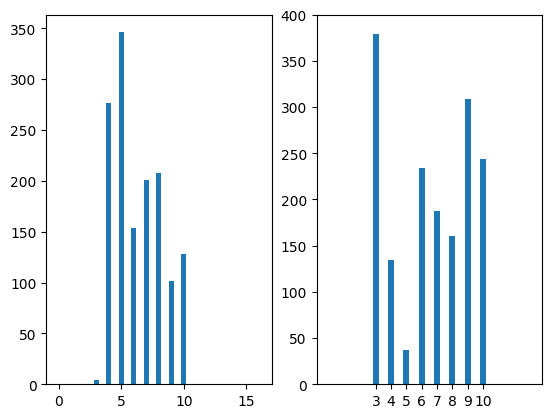

In [25]:
# plot the fires non-fires dates histogram 
nonfires_m = nonfires_dates_s.dt.month
fires_m = []
for k, v in fires_stat.items():
  fires_m += v * [k]
fig, ax = plt.subplots(1, 2,)
months_ = [int(m) for m in months_range]
labels_ = map(lambda x: str(x), months_)
plt.xticks(months_, labels_)
plt.ylim(0, 400)
# plt.xlim(3, 11)
ax[0].hist(fires_m,  bins=np.arange(18) - 0.5, rwidth=0.4)
# plt.xlim(3, 11)
ax[1].hist(nonfires_m, bins=np.arange(15) - 0.5, rwidth=0.4)
plt.show()

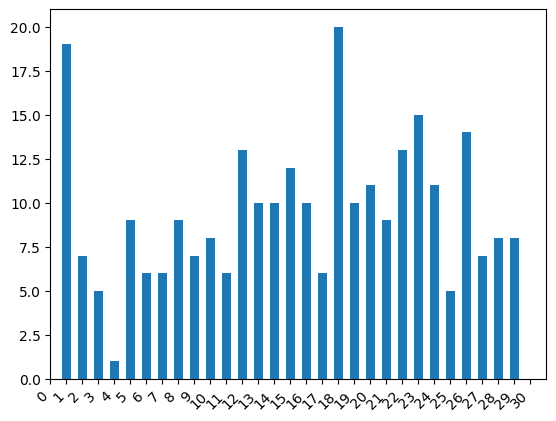

In [26]:
a = nonfires_dates_s[nonfires_dates_s.dt.month == 9].dt.day
# print(a[a==1].size)
months_ = [int(m) for m in range(31)]
labels_ = map(lambda x: str(x), months_)
fig, ax = plt.subplots(1, 1)
plt.xticks(months_, labels_)
plt.xlim(0, 31)
# plt.gca().set_aspect("equal", adjustable="box")
# plt.axis("auto")
plt.hist(a, bins=np.arange(31) - 0.5, rwidth=0.6)
plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

##### Unite fires and non-fires datasets, drop the unnecessary columns

In [27]:
# create a date column in the non-fires dataset
nonfires_cp["dt_first"] = nonfires_dates_s
nonfires_cp.shape, nonfires_cp.dtypes

((1686, 6),
 id                   int64
 lon                float64
 lat                float64
 year                 int32
 geometry          geometry
 dt_first    datetime64[ns]
 dtype: object)

In [28]:
# concatenate fires and non-fires datasets
fires_nonfires_ds = gpd.pd.concat([fires_cp, nonfires_cp]).reset_index(drop=True)
print(fires_nonfires_ds.shape, fires_cp.shape, fires_cp.shape[0] + nonfires_cp.shape[0])
# display 10 elements in the middle
a = fires_nonfires_ds.iloc[fires_cp.shape[0] - 10:fires_cp.shape[0] + 10, :]
print("Display 10 el in the middle:", a.shape, a.dtypes, a.reset_index(drop=True), sep="\n")

(3088, 11) (1402, 10) 3088
Display 10 el in the middle:
(20, 11)
year                 int32
fire_id            float64
lat                float64
lon                float64
dt_first    datetime64[ns]
dt_last     datetime64[ns]
Area               float64
Area_les           float64
dt_liq              object
geometry          geometry
id                 float64
dtype: object
    year  fire_id        lat         lon            dt_first  \
0   2015  84475.0  53.573600  107.507000 2015-09-13 03:30:00   
1   2015  84522.0  53.487000  107.193000 2015-09-13 12:55:00   
2   2015  84391.0  53.468300  107.422900 2015-09-12 14:00:00   
3   2015  58882.0  53.398300  107.197900 2015-06-14 13:25:00   
4   2015  84350.0  53.404300  107.396000 2015-09-12 12:15:00   
5   2015  84339.0  53.358700  107.265900 2015-09-12 12:15:00   
6   2015  64832.0  53.516300  107.016900 2015-07-20 12:50:00   
7   2015  65536.0  53.180900  107.462900 2015-07-22 12:40:00   
8   2015  95778.0  55.731800   97.591100 2015-10

In [29]:
fires_nonfires_ds.explore()

In [30]:
# mark is_fire (1 if fire, 0 if non-fire)
fires_nonfires_ds["is_fire"] = 1
# print(fires_nonfires_ds["is_fire"])
fires_nonfires_ds.loc[fires_nonfires_ds.fire_id.isnull(), "is_fire"] = 0
print(
    fires_nonfires_ds.head(1), fires_nonfires_ds.tail(1),
    fires_nonfires_ds.is_fire.value_counts(),
    sep="\n"
)

   year  fire_id      lat       lon            dt_first             dt_last  \
0  2015  63670.0  60.0217  115.8679 2015-07-16 11:35:00 2015-07-16 11:35:00   

   Area  Area_les               dt_liq  \
0  20.0       4.0  2015-07-21 03:35:00   

                                            geometry  id  is_fire  
0  POLYGON ((12897309.459 8403569.034, 12897309.1... NaN        1  
      year  fire_id        lat        lon   dt_first dt_last  Area  Area_les  \
3087  2015      NaN  53.911422  99.010028 2015-10-12     NaT   NaN       NaN   

     dt_liq                         geometry      id  is_fire  
3087    NaN  POINT (11021745.86 7153398.515)  1685.0        0  
is_fire
0    1686
1    1402
Name: count, dtype: int64


In [31]:
final_ds = fires_nonfires_ds.drop(["fire_id", "dt_last", "dt_liq", "Area", "Area_les", "id"], axis=1)
assert final_ds.isnull().any().sum() == 0

In [32]:
# small corrections: change year type to int, cut the time part of the value in dt_first
# and rename dt_first column to event_date
final_ds.year = final_ds.year.astype("int32")
final_ds.dt_first = final_ds.dt_first.dt.normalize()
result_ds = final_ds.rename(columns={"dt_first" : "event_date"})
print(result_ds.dtypes)
result_ds.head(5)

year                   int32
lat                  float64
lon                  float64
event_date    datetime64[ns]
geometry            geometry
is_fire                int64
dtype: object


,year,lat,lon,event_date,geometry,is_fire
0,2015,60.0217,115.8679,2015-07-16,"POLYGON ((12897309.459 8403569.034, 12897309.1...",1
1,2015,59.7178,115.0410,2015-08-06,"POLYGON ((12805346.404 8336204.874, 12805346.1...",1
2,2015,59.5761,113.9840,2015-09-25,"POLYGON ((12687257.185 8304795.856, 12687256.7...",1
3,2015,59.4877,113.6689,2015-09-24,"POLYGON ((12653525.898 8287187.746, 12653525.7...",1
4,2015,59.3922,114.0660,2015-07-12,"POLYGON ((12696710.022 8264660.54, 12696709.73...",1


##### Connect the regular grid

In [33]:
# use result_ds and regular_grid
result_ds.head(5), regular_grid.head(5)

(   year      lat       lon event_date  \
 0  2015  60.0217  115.8679 2015-07-16   
 1  2015  59.7178  115.0410 2015-08-06   
 2  2015  59.5761  113.9840 2015-09-25   
 3  2015  59.4877  113.6689 2015-09-24   
 4  2015  59.3922  114.0660 2015-07-12   
 
                                             geometry  is_fire  
 0  POLYGON ((12897309.459 8403569.034, 12897309.1...        1  
 1  POLYGON ((12805346.404 8336204.874, 12805346.1...        1  
 2  POLYGON ((12687257.185 8304795.856, 12687256.7...        1  
 3  POLYGON ((12653525.898 8287187.746, 12653525.7...        1  
 4  POLYGON ((12696710.022 8264660.54, 12696709.73...        1  ,
     LAT    LON
 0  51.5  100.0
 1  52.0  100.0
 2  52.5  100.0
 3  53.0  100.0
 4  53.5  100.0)

In [34]:
# convert regular grid pandas dataframe to geopandas dataframe
points = gpd.points_from_xy(x=regular_grid.LON, y=regular_grid.LAT, crs="EPSG:4326")
regular_grid["geometry"] = points.to_crs(project_crs)
regular_grid = gpd.GeoDataFrame(regular_grid)
regular_grid

,LAT,LON,geometry
0,51.5,100.0,POINT (11131949.079 6710219.083)
1,52.0,100.0,POINT (11131949.079 6800125.454)
2,52.5,100.0,POINT (11131949.079 6891041.724)
3,53.0,100.0,POINT (11131949.079 6982997.92)
4,53.5,100.0,POINT (11131949.079 7076025.276)
...,...,...,...
1217,62.0,99.5,POINT (11076289.334 8859142.801)
1218,62.5,99.5,POINT (11076289.334 8978686.319)
1219,63.0,99.5,POINT (11076289.334 9100250.907)
1220,63.5,99.5,POINT (11076289.334 9223915.66)


In [35]:
# join datasets by distance
grid_ds = result_ds.sjoin_nearest(regular_grid, how="left")
grid_ds

,year,lat,lon,event_date,geometry,is_fire,index_right,LAT,LON
0,2015,60.021700,115.867900,2015-07-16,"POLYGON ((12897309.459 8403569.034, 12897309.1...",1,849,60.0,116.0
1,2015,59.717800,115.041000,2015-08-06,"POLYGON ((12805346.404 8336204.874, 12805346.1...",1,796,59.5,115.0
2,2015,59.576100,113.984000,2015-09-25,"POLYGON ((12687257.185 8304795.856, 12687256.7...",1,744,59.5,114.0
3,2015,59.487700,113.668900,2015-09-24,"POLYGON ((12653525.898 8287187.746, 12653525.7...",1,718,59.5,113.5
4,2015,59.392200,114.066000,2015-07-12,"POLYGON ((12696710.022 8264660.54, 12696709.73...",1,744,59.5,114.0
...,...,...,...,...,...,...,...,...,...
3083,2015,55.518063,104.196277,2015-09-13,POINT (11599076.501 7463067.792),0,216,55.5,104.0
3084,2015,57.855626,115.913720,2015-03-03,POINT (12903456.34 7937050.102),0,845,58.0,116.0
3085,2015,54.588979,105.621756,2015-03-21,POINT (11757760.078 7282500.549),0,292,54.5,105.5
3086,2015,55.455473,99.109603,2015-09-15,POINT (11032830.526 7450770.729),0,1178,55.5,99.0


In [36]:
grid_ds.drop("index_right", axis=1, inplace=True)
grid_ds.dtypes

year                   int32
lat                  float64
lon                  float64
event_date    datetime64[ns]
geometry            geometry
is_fire                int64
LAT                  float64
LON                  float64
dtype: object

In [37]:
m = grid_ds.explore()
regular_grid.explore(m=m, color="red")

In [38]:
# !!! Attention: changes the original dataset (run only once)
grid_ds.rename(columns={"LAT" : "grid_lat"}, inplace=True)
grid_ds.rename(columns={"LON" : "grid_lon"}, inplace=True)
grid_ds.columns

Index(['year', 'lat', 'lon', 'event_date', 'geometry', 'is_fire', 'grid_lat',
       'grid_lon'],
      dtype='object')

In [39]:
# check for duplicates and drop them
dup_idx = grid_ds[grid_ds.index.duplicated()].index
print("Duplicates in index:", grid_ds[grid_ds.index.duplicated()].index)
grid_ds = grid_ds[~grid_ds.index.duplicated(keep="first")]
print("Duplicates in index:", grid_ds.index.duplicated().sum())
grid_ds.reset_index(drop=True, inplace=True)
grid_ds.index

Duplicates in index: Index([1398], dtype='int64')
Duplicates in index: 0


RangeIndex(start=0, stop=3088, step=1)

In [40]:
# check that the number of (non)fires correspond to the origanl (non)fires datasets
vc = grid_ds.is_fire.value_counts() 
print("Fires number is equal:", vc[1] == fires_cp.shape[0])
print("Non-fires number is equal:", vc[0] == nonfires_cp.shape[0])

Fires number is equal: True
Non-fires number is equal: True


In [41]:
# # write file
# write_path = project_files + "dataset_plus_grid/"
# if not os.path.exists(write_path):
#   os.mkdir(write_path)
# grid_ds.to_file(write_path + "dataset_" + str(data_year) + ".geojson")